<a href="https://colab.research.google.com/github/ngoan22mse23088/ImageVideoProcessing/blob/master/IVP501_Assignment02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FPT School of Business and Technology (FSB) - FPT University
FSB-MSE12-HCM : Image Video Processing (IVP501) <br>
Instructor : Dr. Nguyen Ngoc Truong Minh <br>
22MSE23088 : Le Chi Ngoan <br>
22MSE23082 : Nguyen Thi Kieu Tien <br>
22MSE23084 : Nguyen Pham Khanh Ngoc <br>


# Home Work 2

Problem 6_1 Arithmetic Mean Filter

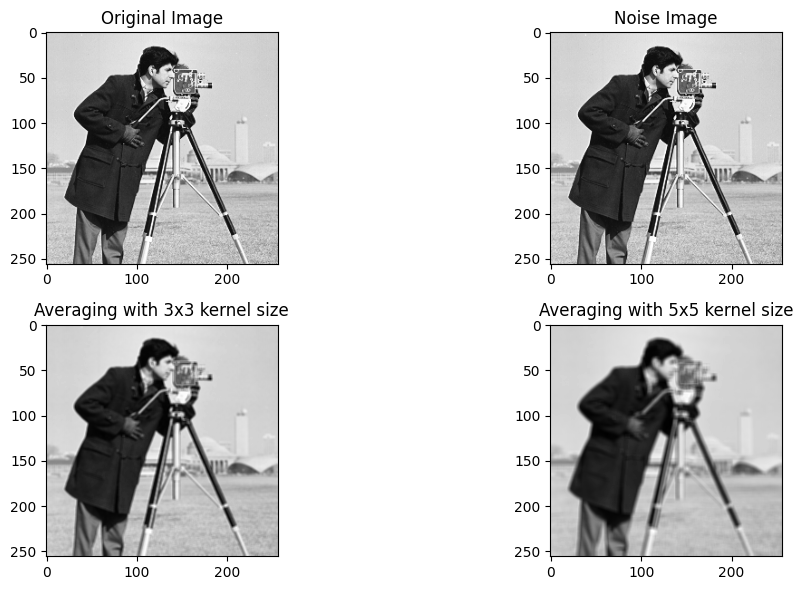

In [2]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/cameraman.tif'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Generate a Gaussian noise image
img_noise = np.float32(img) + np.random.normal(0, 0.001, img.shape).astype(np.float32)

# Apply an average filter using a 3x3 kernel
kernel_size = (3, 3)
img_denoise1 = cv2.blur(img_noise, kernel_size)

# Apply an average filter using a 5x5 kernel
kernel_size = (5, 5)
img_denoise2 = cv2.blur(img_noise, kernel_size)

# Plot the images
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(img_noise, cmap='gray')
plt.title('Noise Image')

plt.subplot(2, 2, 3)
plt.imshow(img_denoise1, cmap='gray')
plt.title('Averaging with 3x3 kernel size')

plt.subplot(2, 2, 4)
plt.imshow(img_denoise2, cmap='gray')
plt.title('Averaging with 5x5 kernel size')

plt.tight_layout()
plt.show()

Problem 6_2 Contraharmonic Mean Filter

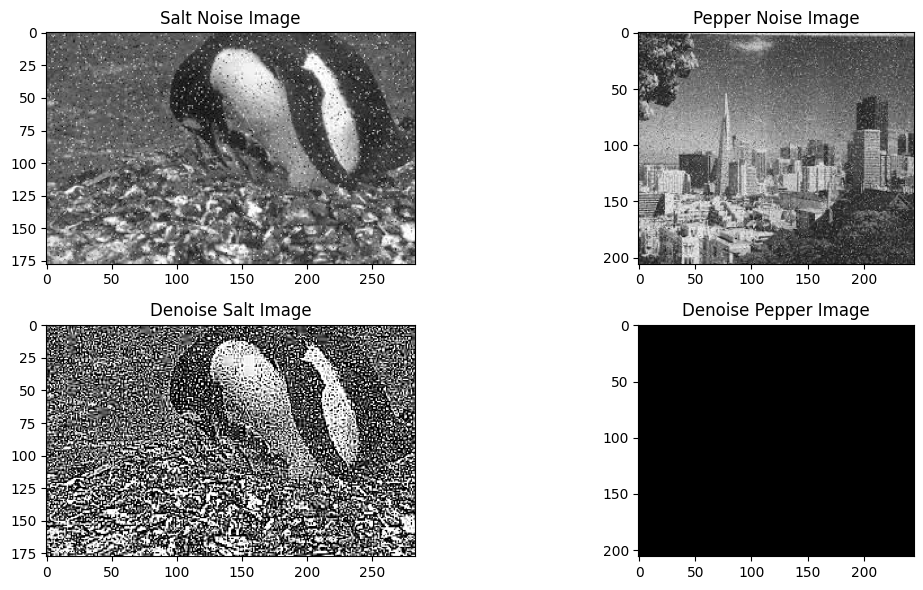

In [6]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

# Load the salt noise image from Git repository
url_salt = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/salt_noise.jpg'
resp_salt = urllib.request.urlopen(url_salt)
arr_salt = np.asarray(bytearray(resp_salt.read()), dtype=np.uint8)
img_salt = cv2.imdecode(arr_salt, cv2.IMREAD_GRAYSCALE)

# Load the pepper noise image from Git repository
url_pepper = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/peppep_noise.jpg'
resp_pepper = urllib.request.urlopen(url_pepper)
arr_pepper = np.asarray(bytearray(resp_pepper.read()), dtype=np.uint8)
img_pepper = cv2.imdecode(arr_pepper, cv2.IMREAD_GRAYSCALE)

# Function to calculate the harmonic ratio
def harmonicRatio(arr, r):
    return np.mean(arr**(r+1)) / np.mean(arr**r)

# Filter the salt noise image with a negative r value
img_salt_denoise = cv2.filter2D(img_salt, -1, np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]]))

# Filter the pepper noise image with a positive r value
img_pepper_denoise = cv2.filter2D(img_pepper, -1, np.array([[1, 1, 1], [1, 9, 1], [1, 1, 1]]))

# Plot the images
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
plt.imshow(img_salt, cmap='gray')
plt.title('Salt Noise Image')

plt.subplot(2, 2, 2)
plt.imshow(img_pepper, cmap='gray')
plt.title('Pepper Noise Image')

plt.subplot(2, 2, 3)
plt.imshow(img_salt_denoise, cmap='gray')
plt.title('Denoise Salt Image')

plt.subplot(2, 2, 4)
plt.imshow(img_pepper_denoise, cmap='gray')
plt.title('Denoise Pepper Image')

plt.tight_layout()
plt.show()

Problem6_3 Low-Pass Filter

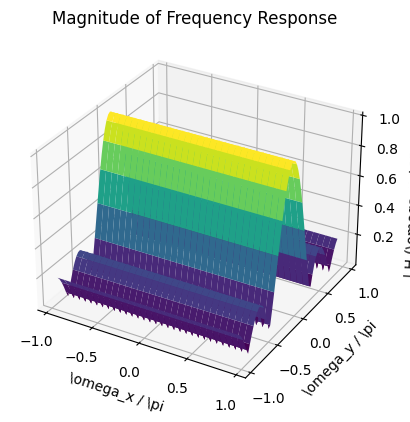

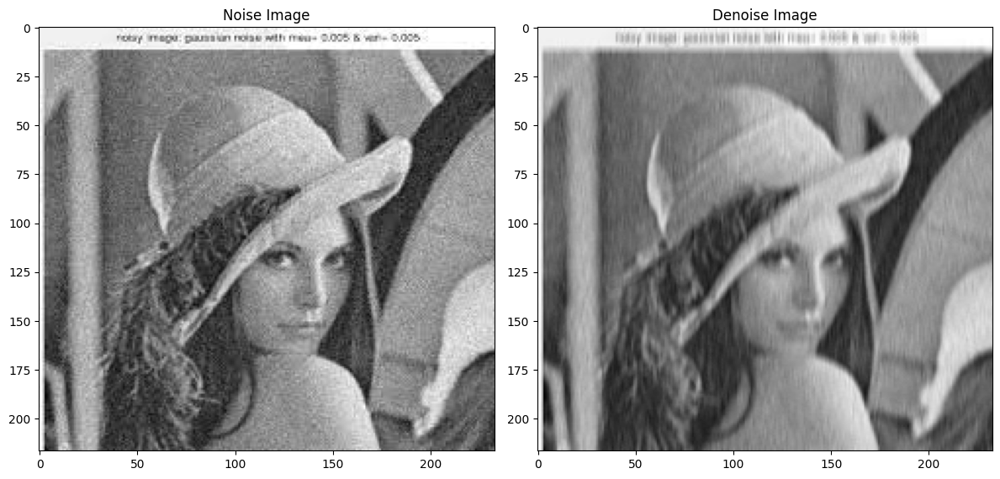

In [7]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

# Load the noisy image from Git repository
url_noise = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/noisy_image.jfif'
resp_noise = urllib.request.urlopen(url_noise)
arr_noise = np.asarray(bytearray(resp_noise.read()), dtype=np.uint8)
img_noise = cv2.imdecode(arr_noise, cv2.IMREAD_GRAYSCALE)

# LPF design
# Step 1: Construct a grid of (omega_x, omega_y)
wx, wy = np.meshgrid(np.arange(-3, 3.1, 0.1), np.arange(-3, 3.1, 0.1))

# Step 2: Compute frequency response
type = '1d_vertical'
if type == '2d':
    H = (1/25) * (1 + 2*np.cos(wx) + 2*np.cos(2*wx)) * (1 + 2*np.cos(wy) + 2*np.cos(2*wy))
    h = 1/25 * np.ones((5, 5))
elif type == '1d_horizontal':
    H = (1/5) * (1 + 2*np.cos(wx) + 2*np.cos(2*wx))
    h = 1/5 * np.ones((1, 5))
else:
    H = (1/5) * (1 + 2*np.cos(wy) + 2*np.cos(2*wy))
    h = 1/5 * np.ones((5, 1))

# Step 3: Plot magnitude of frequency response
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(wx/np.pi, wy/np.pi, np.abs(H), cmap='viridis')
ax.set_xlabel('\omega_x / \pi')
ax.set_ylabel('\omega_y / \pi')
ax.set_zlabel('| H (\omega_x, \omega_y) |')
plt.title('Magnitude of Frequency Response')
plt.show()

# Apply the designed filter to the noise image
img_denoise = cv2.filter2D(img_noise, -1, h, borderType=cv2.BORDER_REFLECT)

# Plot the images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(img_noise, cmap='gray')
plt.title('Noise Image')

plt.subplot(1, 2, 2)
plt.imshow(img_denoise, cmap='gray')
plt.title('Denoise Image')

plt.tight_layout()
plt.show()

Problem 7_1 Convolution between a kernel and an image

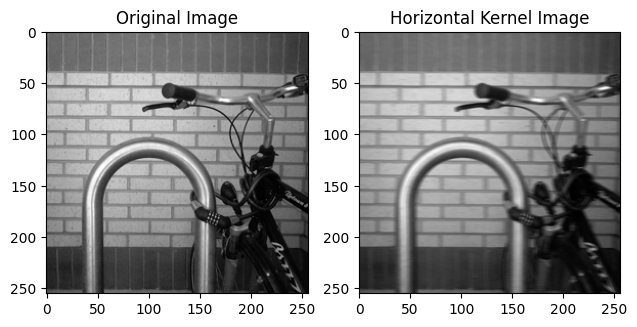

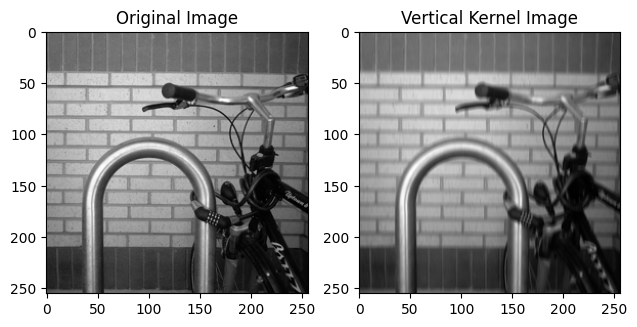

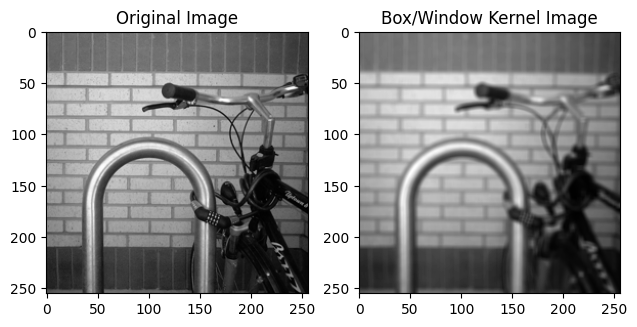

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Load image
url = "https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/bike.png"
Img = imread(url)

# Construct three different kernels (impulse responses)
k1 = np.ones((1, 5)) / 5  # horizontal kernel
k2 = np.ones((5, 1)) / 5  # vertical kernel
k3 = np.ones((5, 5)) / 25  # box/window kernel

# Perform convolution on the image
filteredImg1 = cv2.filter2D(Img, -1, k1, borderType=cv2.BORDER_REFLECT)
filteredImg2 = cv2.filter2D(Img, -1, k2, borderType=cv2.BORDER_REFLECT)
filteredImg3 = cv2.filter2D(Img, -1, k3, borderType=cv2.BORDER_REFLECT)

# Show images
fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg1, cmap='gray')
axs[1].set_title('Horizontal Kernel Image')
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg2, cmap='gray')
axs[1].set_title('Vertical Kernel Image')
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg3, cmap='gray')
axs[1].set_title('Box/Window Kernel Image')
plt.tight_layout()
plt.show()

# Save images
cv2.imwrite('Horizontal_Convolution.png', filteredImg1 * 255)
cv2.imwrite('Vertical_Convolution.png', filteredImg2 * 255)
cv2.imwrite('Box_Convolution.png', filteredImg3 * 255)

Problem 7_2 Sharpening filter an image

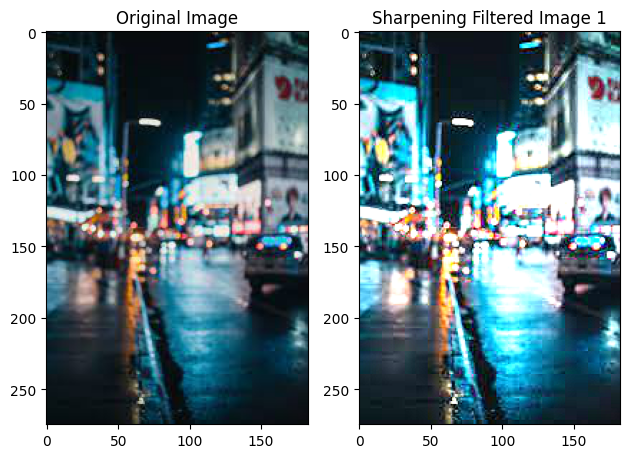

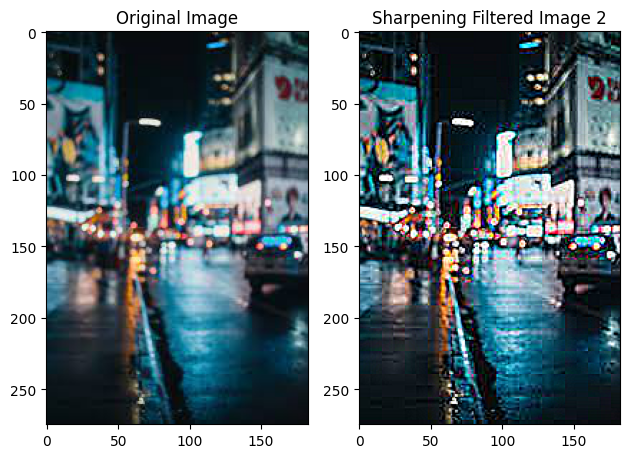

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Load image
url = "https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/street.jfif"
Img = imread(url)

# Apply a sharpening filter to the image
h1 = np.array([[0, -1, 0], [-1, 9, -1], [0, -1, 0]]) / 3  # 3-by-3 box filter
h2 = np.array([[0, 0, -1, 0, 0],
               [0, -1, -1, -1, 0],
               [-1, -1, 16, -1, -1],
               [0, -1, -1, -1, 0],
               [0, 0, -1, 0, 0]]) / 4  # 5-by-5 box filter

filteredImg1 = cv2.filter2D(Img, -1, h1, borderType=cv2.BORDER_REPLICATE)
filteredImg2 = cv2.filter2D(Img, -1, h2, borderType=cv2.BORDER_REPLICATE)

# Show images
fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg1, cmap='gray')
axs[1].set_title('Sharpening Filtered Image 1')
plt.tight_layout()
plt.show()

fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')
axs[1].imshow(filteredImg2, cmap='gray')
axs[1].set_title('Sharpening Filtered Image 2')
plt.tight_layout()
plt.show()

# Save images
cv2.imwrite('Sharpening_Filter1.png', filteredImg1 * 255)
cv2.imwrite('Sharpening_Filter2.png', filteredImg2 * 255)

Problem 7_3 Wiener Filtering with Additive Noise

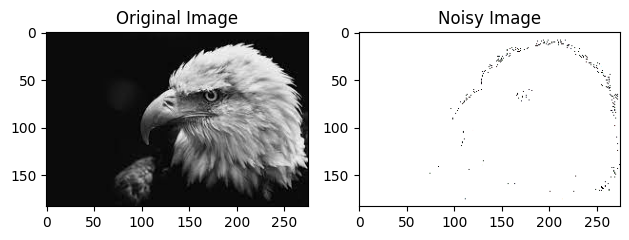

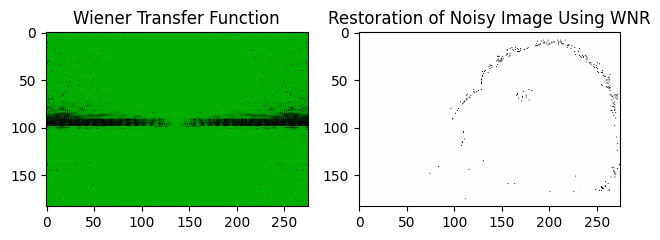

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.util import img_as_ubyte
from scipy.fft import fft2, ifft2

# Load image
url = "https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/eagle.jfif"
Img = imread(url)

# Show original image
fig, axs = plt.subplots(1, 2)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')

# Simulate additive Gaussian noise
noise_mean = 0
noise_var = 0.005
noisyImg = np.clip(Img + np.random.normal(noise_mean, np.sqrt(noise_var), Img.shape), 0, 1)
axs[1].imshow(noisyImg, cmap='gray')
axs[1].set_title('Noisy Image')
plt.tight_layout()
plt.show()

# Save noisy image
cv2.imwrite('Additive_Gaussian_Noise.png', img_as_ubyte(noisyImg))

# Perform Wiener Filtering on the noisy image
dif = 255 * (noisyImg - Img)
rms_err_before_wnr = np.sqrt(np.mean(dif ** 2))

noisy_dft = fft2(noisyImg)  # DFT of noisy image
Img_psd = np.abs(fft2(Img)) ** 2  # original image Power Spectral Density (PSD)
noise_psd = np.prod(Img_psd.shape) * noise_var  # white noise PSD
wnr_H = Img_psd / (Img_psd + noise_psd)  # Wiener transfer function

fig, axs = plt.subplots(1, 2)
axs[0].imshow(np.fft.fftshift(np.log(1 + wnr_H)), cmap='jet', vmin=0, vmax=np.log(2 + np.max(wnr_H)))
axs[0].set_title('Wiener Transfer Function')
# axs[0].colorbar()
wnr_dft = noisy_dft * wnr_H  # DFT of filtered image
wnr = np.real(ifft2(wnr_dft))  # convert back to spatial domain
axs[1].imshow(wnr, cmap='gray')
axs[1].set_title('Restoration of Noisy Image Using WNR')
plt.tight_layout()
plt.show()

# Save filtered image
# cv2.imwrite('Wiener_Filtered_Additive_Noise.png', img_as_ubyte(wnr))

dif = 255 * (wnr - Img)
rms_err_after_wnr = np.sqrt(np.mean(dif ** 2))

Problem 7_4 Wiener Filtering with Blurred and Additive Noise

RMS Error after Wiener filtering: 39.68639244296924


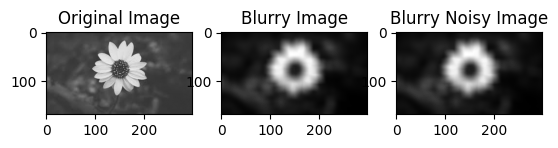

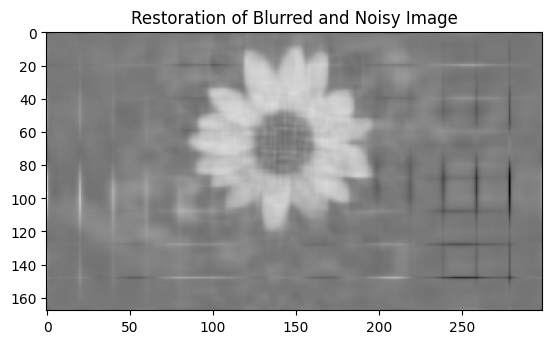

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.util import img_as_ubyte
from scipy.signal import convolve2d
from scipy.fft import fft2, ifft2
from scipy.ndimage import gaussian_filter

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flower.jfif')
Img = Img.astype(np.float64) / 255.0

# Show original image
plt.figure(1)
plt.subplot(1, 3, 1)
plt.imshow(Img)
plt.title('Original Image')

# Simulate a blur motion
LEN = 20
THETA = 10
PSF = gaussian_filter(np.eye(LEN), sigma=THETA)
Img_2d = np.mean(Img, axis=2)  # Convert to 2-D grayscale

# Perform convolution
blurredImg = convolve2d(Img_2d, PSF, mode='same', boundary='symm')

# Show blurry image
plt.subplot(1, 3, 2)
plt.imshow(blurredImg, cmap='gray')
plt.title('Blurry Image')

# Simulate additive noise
noise_mean = 0
noise_var = 0.01
blurred_noisyImg = blurredImg + np.random.normal(noise_mean, noise_var, size=blurredImg.shape)

# Show blurry noisy image
plt.subplot(1, 3, 3)
plt.imshow(blurred_noisyImg, cmap='gray')
plt.title('Blurry Noisy Image')

# Perform Wiener filtering
estimated_nr = noise_var / np.var(Img_2d)
PSF_pad = np.pad(PSF, ((0, blurred_noisyImg.shape[0] - PSF.shape[0]), (0, blurred_noisyImg.shape[1] - PSF.shape[1])))
PSF_fft = fft2(PSF_pad)
blurred_noisyImg_fft = fft2(blurred_noisyImg)
wnr_fft = np.conj(PSF_fft) / (np.abs(PSF_fft) ** 2 + estimated_nr)
wnr = np.real(ifft2(blurred_noisyImg_fft * wnr_fft))

# Show restored image
plt.figure(2)
plt.imshow(wnr, cmap='gray')
plt.title('Restoration of Blurred and Noisy Image')

# Save restored image
# imwrite('Wiener_Filtered_Blurry_Additive_Noise.png', img_as_ubyte(wnr))

# Calculate RMS error
dif = 255 * (wnr - Img_2d)
rms_err_after_wnr = np.sqrt(np.mean(dif**2))
print('RMS Error after Wiener filtering:', rms_err_after_wnr)

plt.show()

Problem 7_5 Binary Dilation

<ipython-input-50-feb9369e9320>:12: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  BW1 = dilation(Img, selem=se1)
<ipython-input-50-feb9369e9320>:15: FutureWarning: `selem` is a deprecated argument name for `dilation`. It will be removed in version 1.0. Please use `footprint` instead.
  BW2 = dilation(Img, selem=se2)


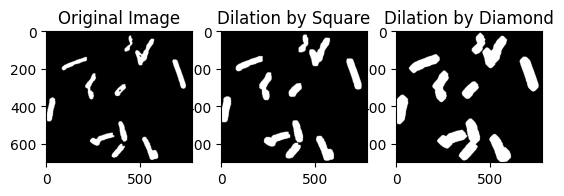

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from skimage.morphology import dilation, square, diamond

# Load image from Git path
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/traces.png')

# Perform dilation with different structuring elements (se)
# a. square with side = 15
se1 = square(10)
BW1 = dilation(Img, selem=se1)
# b. diamond with side = 15
se2 = diamond(15)
BW2 = dilation(Img, selem=se2)

# Show and save images
plt.figure(1)
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(BW1, cmap='gray')
plt.title('Dilation by Square')

plt.subplot(1, 3, 3)
plt.imshow(BW2, cmap='gray')
plt.title('Dilation by Diamond')

imsave('Dilation_Square.png', BW1)
imsave('Dilation_Diamond.png', BW2)

plt.show()

Problem 7_6 Binary Erosion

<ipython-input-51-e3e8967cf797>:12: FutureWarning: `selem` is a deprecated argument name for `erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  BW1 = erosion(Img, selem=se1)
<ipython-input-51-e3e8967cf797>:15: FutureWarning: `selem` is a deprecated argument name for `erosion`. It will be removed in version 1.0. Please use `footprint` instead.
  BW2 = erosion(Img, selem=se2)
<ipython-input-51-e3e8967cf797>:32: UserWarning: Erosion_Disk_30.png is a low contrast image
  imsave('Erosion_Disk_30.png', BW2)


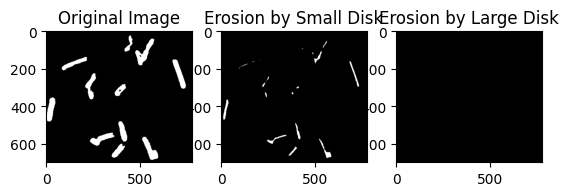

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread, imsave
from skimage.morphology import erosion, disk

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/traces.png')

# Perform erosion with different structuring elements (se)
# a. small disk with radius = 10
se1 = disk(10)
BW1 = erosion(Img, selem=se1)
# b. large disk with radius = 30
se2 = disk(30)
BW2 = erosion(Img, selem=se2)

# Show and save images
plt.figure(1)
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(BW1, cmap='gray')
plt.title('Erosion by Small Disk')

plt.subplot(1, 3, 3)
plt.imshow(BW2, cmap='gray')
plt.title('Erosion by Large Disk')

imsave('Erosion_Disk_10.png', BW1)
imsave('Erosion_Disk_30.png', BW2)

plt.show()

Problem 8_1 Binary Erosion with Coins

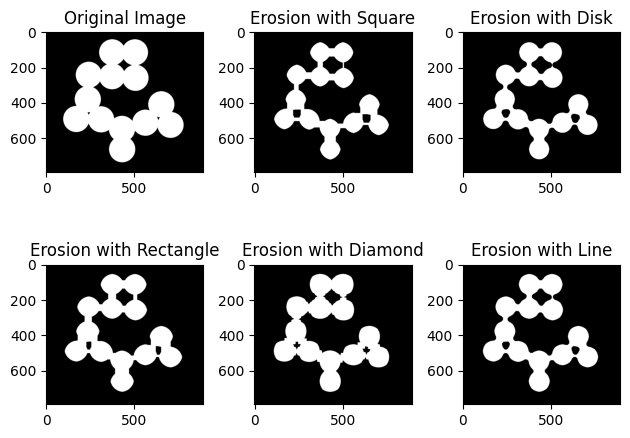

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import exposure

# Load image
import urllib.request

# URL of the image
# Load the image from Git repository
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/circles.png')

# Perform erosion with different structuring elements
# a. square with side = 30
se1 = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 30))
BW1 = cv2.erode(Img, se1)

# b. disk with radius = 35
se2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (35, 35))
BW2 = cv2.erode(Img, se2)

# c. rectangle with dimensions = [15 30]
se3 = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 30))
BW3 = cv2.erode(Img, se3)

# d. diamond with radius = 30
se4 = cv2.getStructuringElement(cv2.MORPH_CROSS, (30, 30))
BW4 = cv2.erode(Img, se4)

# e. line with length = 30 and inclined degree = 45
se5 = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 30))
se5 = cv2.warpAffine(se5, cv2.getRotationMatrix2D((15, 15), 45, 1), (30, 30))
BW5 = cv2.erode(Img, se5)

# Show and save images
fig, axs = plt.subplots(2, 3)
axs[0, 0].imshow(Img, cmap='gray')
axs[0, 0].set_title('Original Image')
axs[0, 1].imshow(BW1, cmap='gray')
axs[0, 1].set_title('Erosion with Square')
axs[0, 2].imshow(BW2, cmap='gray')
axs[0, 2].set_title('Erosion with Disk')
axs[1, 0].imshow(BW3, cmap='gray')
axs[1, 0].set_title('Erosion with Rectangle')
axs[1, 1].imshow(BW4, cmap='gray')
axs[1, 1].set_title('Erosion with Diamond')
axs[1, 2].imshow(BW5, cmap='gray')
axs[1, 2].set_title('Erosion with Line')
plt.tight_layout()

cv2.imwrite('Binary_Erosion_Coins_Square.png', BW1)
cv2.imwrite('Binary_Erosion_Coins_Disk.png', BW2)
cv2.imwrite('Binary_Erosion_Coins_Rectangle.png', BW3)
cv2.imwrite('Binary_Erosion_Coins_Diamond.png', BW4)
cv2.imwrite('Binary_Erosion_Coins_Line.png', BW5)

plt.show()

Problem 8_2 Hole Detection in a Fence using Erosion

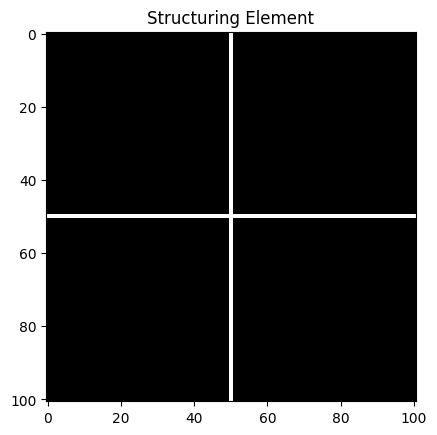

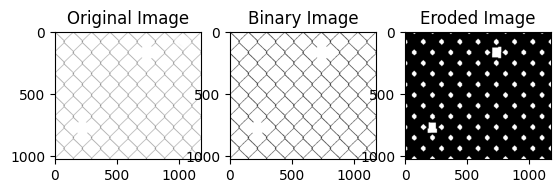

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import binary_erosion

# Load the image from Git repository
Img = rgb2gray(imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/fence.jpg'))
ImgSize = Img.shape
level = threshold_otsu(Img)
BW = Img > level

# Perform erosion with a cross structuring element
length = 101
NHOOD = np.zeros((length, length))
NHOOD[length // 2, :] = 1
NHOOD[:, length // 2] = 1
se = NHOOD.astype(bool)

# Show the structuring element
plt.figure(1)
plt.imshow(NHOOD, cmap='gray')
plt.title('Structuring Element')

BW1 = binary_erosion(BW, se)

# Display the results
plt.figure(2)
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(BW, cmap='gray')
plt.title('Binary Image')
plt.subplot(1, 3, 3)
plt.imshow(BW1, cmap='gray')
plt.title('Eroded Image')

# Save the images
cv2.imwrite('Binary_Erosion_Fence_BW.jpg', (BW * 255).astype(np.uint8))
cv2.imwrite('Binary_Erosion_Fence_Hole_Detection.jpg', (BW1 * 255).astype(np.uint8))

plt.show()

Problem 8_3 Edge Detection with Dilation and Erosion

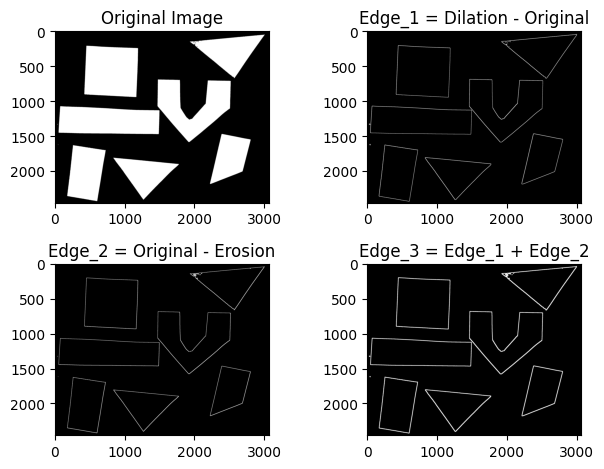

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.morphology import dilation, erosion, square

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/objects.png').astype(float)

# Detect edges
se = square(10)  # Apply any structuring element
Img_dilation = dilation(Img, se)
Img_erosion = erosion(Img, se)
edge_1 = Img_dilation - Img
edge_2 = Img - Img_erosion
edge_3 = edge_1 + edge_2

# Show images
plt.subplot(2, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(2, 2, 2)
plt.imshow(edge_1, cmap='gray')
plt.title('Edge_1 = Dilation - Original')

plt.subplot(2, 2, 3)
plt.imshow(edge_2, cmap='gray')
plt.title('Edge_2 = Original - Erosion')

plt.subplot(2, 2, 4)
plt.imshow(edge_3, cmap='gray')
plt.title('Edge_3 = Edge_1 + Edge_2')

plt.tight_layout()
plt.show()

# Save images
cv2.imwrite('Edge_Detection_by_Dilation.jpg', edge_1)
cv2.imwrite('Edge_Detection_by_Erosion.jpg', edge_2)
cv2.imwrite('Edge_Detection_by_Combination.jpg', edge_3)


Problem 8_4 Graylevel Dilation and Erosion

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import grey_dilation, grey_erosion
from skimage.io import imread

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/portrait.jpg')

# Choose any column of the image as 1-d sample array
originalColumn = Img[:, 1800, 0]  # Extract the red channel

# Loop over different structuring elements (i.e., line)
for length in range(1, 22, 3):
    se = np.ones(length)
    dilated_Col = grey_dilation(originalColumn, structure=se)
    eroded_Col = grey_erosion(originalColumn, structure=se)

    plt.figure()
    plt.plot(originalColumn, 'b--')
    plt.plot(dilated_Col, 'r', linewidth=1)
    plt.plot(eroded_Col, 'g', linewidth=1)

    plt.title(f'Structuring Element Length = {length}')
    plt.savefig(f'1D_Dilation_Erosion_{length}.png')

    plt.close()

Problem 8_5 Coin Counting

Number of coins: 20


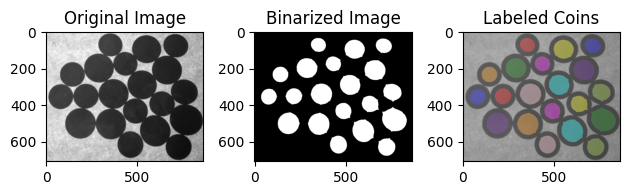

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.morphology import disk
from skimage.filters import threshold_otsu
from skimage.measure import label
from skimage.color import label2rgb

# Load image
Img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/coins.png')

# Counting on processed image
fig, axs = plt.subplots(1, 3)
axs[0].imshow(Img, cmap='gray')
axs[0].set_title('Original Image')

# Binarize the original image
se = disk(25)
dilatedImg = cv2.dilate(Img, se)
level = threshold_otsu(dilatedImg)
bwImg2 = 1 - (dilatedImg >= level)
axs[1].imshow(bwImg2, cmap='gray')
axs[1].set_title('Binarized Image')

# Object counting
L, obj = label(bwImg2, connectivity=2, return_num=True)
rgbLabel2 = label2rgb(L, image=Img, bg_label=0)
print('Number of coins:', obj)
axs[2].imshow(rgbLabel2)
axs[2].set_title('Labeled Coins')

plt.tight_layout()
plt.show()

Problem 9_1 Edge Detector (Prewitt)

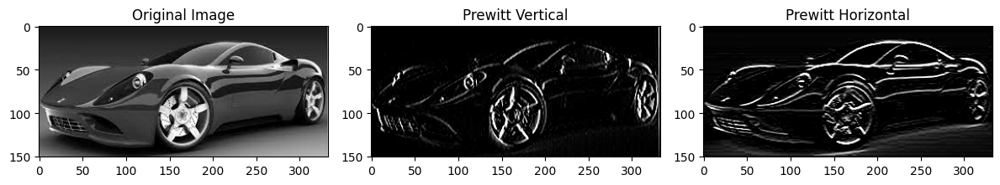

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# Load the image from the Git repository
image_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/car.jpg'
resp = urllib.request.urlopen(image_url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
Img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Apply Prewitt filter in the vertical direction
filteredImg1 = cv2.filter2D(Img, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))

# Apply Prewitt filter in the horizontal direction
filteredImg2 = cv2.filter2D(Img, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))

# Normalize the filtered images
filteredImg1 = np.abs(filteredImg1) / np.max(np.abs(filteredImg1))
filteredImg2 = np.abs(filteredImg2) / np.max(np.abs(filteredImg2))

# Show the original and filtered images
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(filteredImg1, cmap='gray')
plt.title('Prewitt Vertical')

plt.subplot(1, 3, 3)
plt.imshow(filteredImg2, cmap='gray')
plt.title('Prewitt Horizontal')

plt.tight_layout()
plt.show()

Problem 9_2 Zero-Crossing by Laplacian

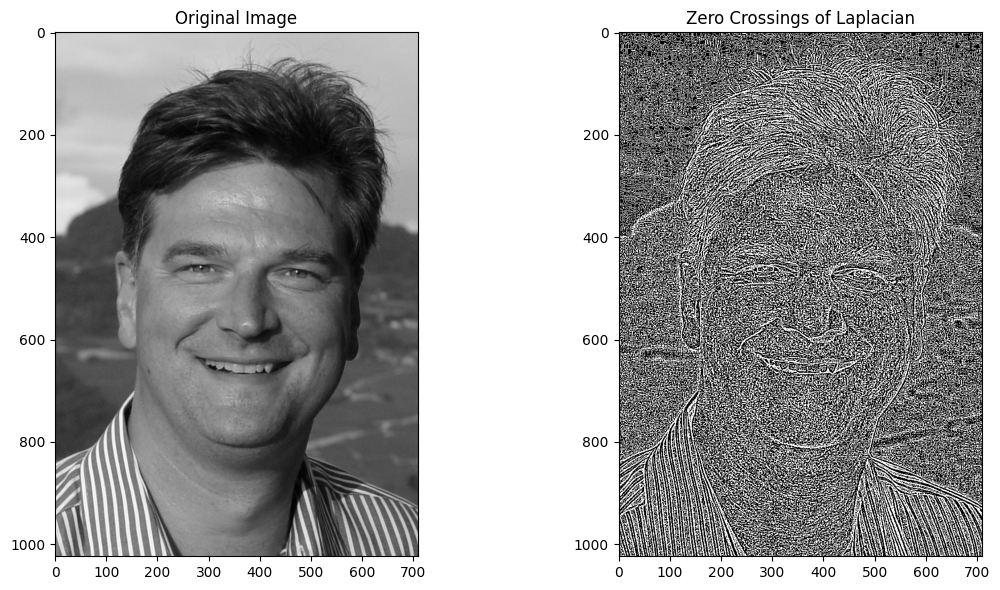

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# Load the image from the Git repository
image_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/portrait_male.png'
resp = urllib.request.urlopen(image_url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
Img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Find zero-crossings of Laplacian
bw = cv2.Laplacian(Img, cv2.CV_64F) > 0

# Show the original image and zero-crossings of Laplacian
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(bw, cmap='gray')
plt.title('Zero Crossings of Laplacian')

plt.tight_layout()
plt.show()

Problem 9_3 Zeros-crossings of Laplacian of Gaussian (LoG)

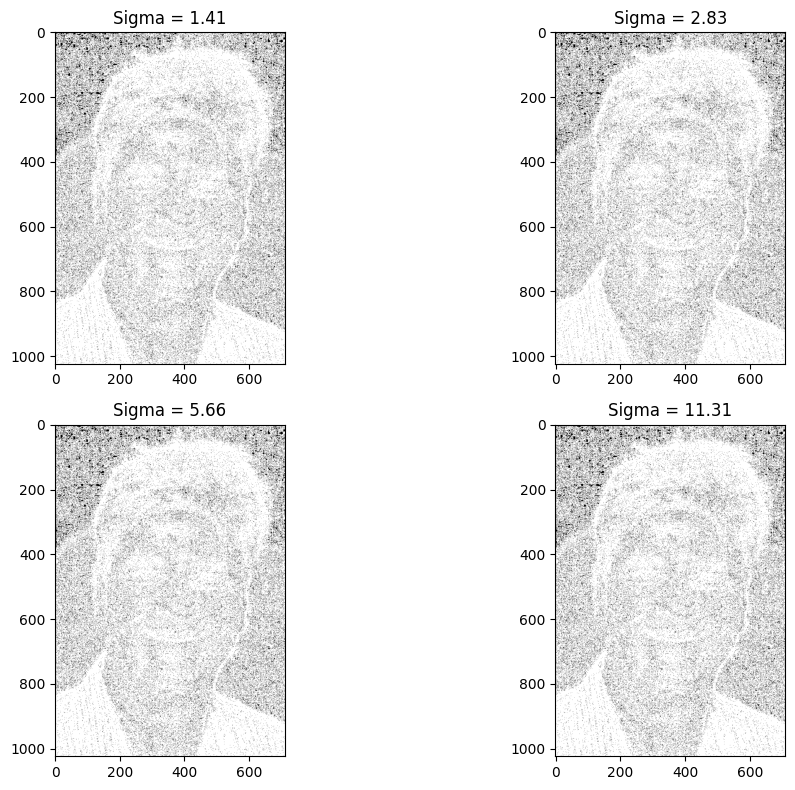

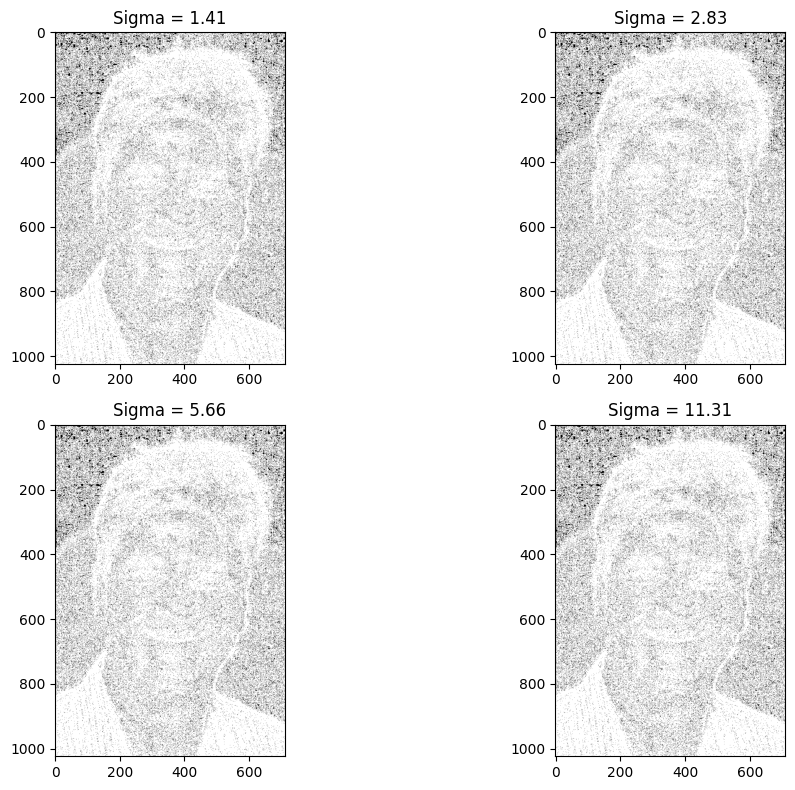

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# Load the image from the Git repository
image_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/portrait_male.png'
resp = urllib.request.urlopen(image_url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
Img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Define the sigma values
sigma_values = [np.sqrt(2), np.sqrt(8), np.sqrt(32), np.sqrt(128)]

# Loop over different standard deviations of Gaussian
thresh = 0
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
for i, sigma in enumerate(sigma_values):
    # Compute and show zero crossings
    bw = cv2.Laplacian(Img, cv2.CV_64F)
    bw = np.abs(bw) > thresh * np.max(bw)
    axes[i // 2, i % 2].imshow(bw, cmap='gray')
    axes[i // 2, i % 2].set_title(f'Sigma = {sigma:.2f}')
    plt.imsave(f'Zero_crossings_log_no_threshold_{sigma:.2f}.png', bw, cmap='gray')

plt.tight_layout()
plt.show()

# Loop over different standard deviations of Gaussian with different thresholds
thresh_values = [0.004, 0.0008, 0.0004, 0.0001]
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
for i, (sigma, thresh) in enumerate(zip(sigma_values, thresh_values)):
    # Compute and show zero crossings
    bw = cv2.Laplacian(Img, cv2.CV_64F)
    bw = np.abs(bw) > thresh * np.max(bw)
    axes[i // 2, i % 2].imshow(bw, cmap='gray')
    axes[i // 2, i % 2].set_title(f'Sigma = {sigma:.2f}')
    plt.imsave(f'Zero_crossings_log_threshold_{sigma:.2f}.png', bw, cmap='gray')

plt.tight_layout()
plt.show()

problem 9_4 Canny Edge Detector

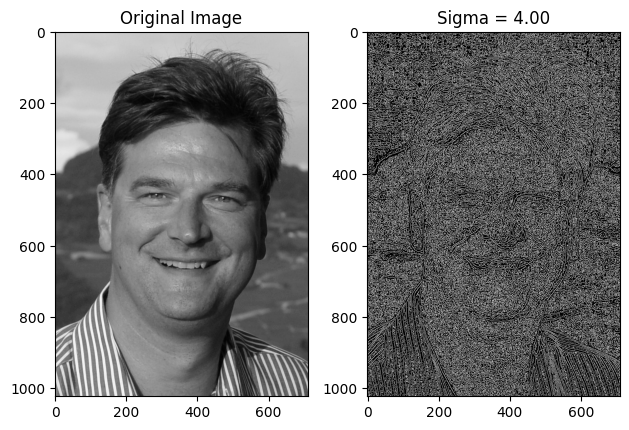

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# Load the image from the Git repository
image_url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/portrait_male.png'
resp = urllib.request.urlopen(image_url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
Img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Define the threshold and sigma values
thresh = 0.005
sigma = np.sqrt(16)

# Apply the Canny edge detection
edges = cv2.Canny(Img, thresh, sigma)

# Display the original image and the detected edges
plt.subplot(1, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(edges, cmap='gray')
plt.title(f'Sigma = {sigma:.2f}')

plt.tight_layout()
plt.show()

# Save the detected edges as an image
# cv2.imwrite(f'Canny_Edge_sigma_{sigma:.2f}.png', edges)

Problem_10_1 Manual Gray Level Threshold

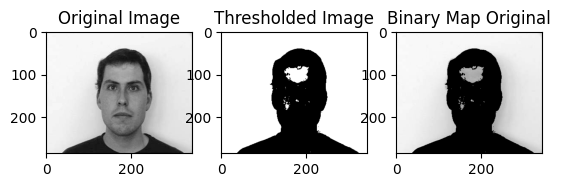

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread

# Load image
img = imread('https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/male.png')

# Define threshold value
level = 108

# Apply thresholding
_, bw_img = cv2.threshold(img, level, 255, cv2.THRESH_BINARY)
blended_img = cv2.bitwise_and(img, img, mask=bw_img)

# Display images
plt.subplot(1, 3, 1), plt.imshow(img, cmap='gray'), plt.title('Original Image')
plt.subplot(1, 3, 2), plt.imshow(bw_img, cmap='gray'), plt.title('Thresholded Image')
plt.subplot(1, 3, 3), plt.imshow(blended_img, cmap='gray'), plt.title('Binary Map Original')

# Save images
cv2.imwrite('Gray_Level_Thresholding.png', bw_img)
cv2.imwrite('Gray_Level_Blended.png', blended_img)

plt.show()

Problem_10_2 Global Gray Leevl Threshold

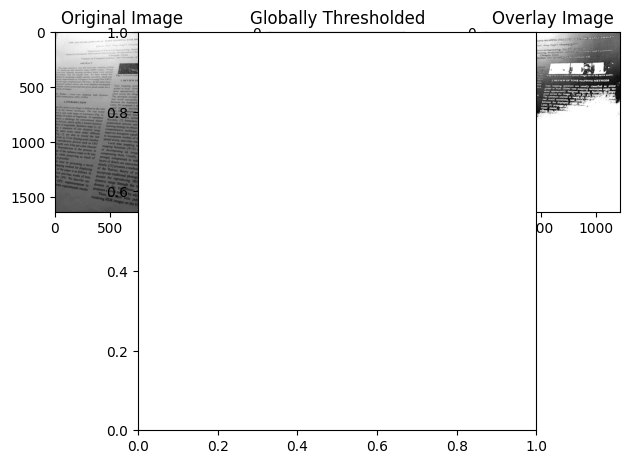

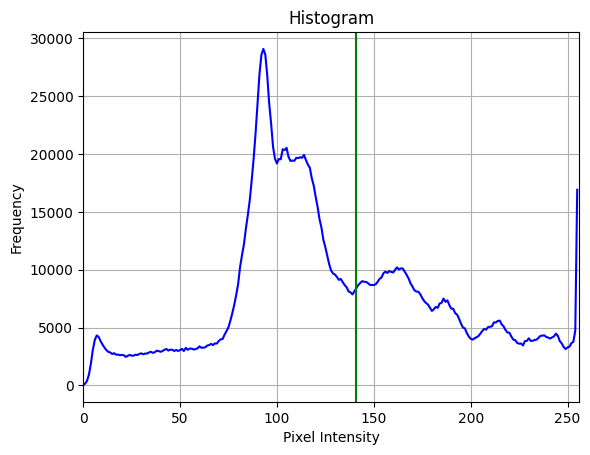

In [16]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

# Load the image from URL
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/paper.png'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Global thresholding by Otsu method
_, bw_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
blended_img = np.where(bw_img == 0, img, 255)

# Display images
plt.subplot(2, 3, 1), plt.imshow(img, cmap='gray'), plt.title('Original Image')
plt.subplot(2, 3, 2), plt.imshow(bw_img, cmap='gray'), plt.title('Globally Thresholded')
plt.subplot(2, 3, 3), plt.imshow(blended_img, cmap='gray'), plt.title('Overlay Image')
plt.axes().set_aspect('equal')
plt.tight_layout()

# Show histogram of image and threshold value
hist = cv2.calcHist([img], [0], None, [256], [0, 256])
otsu_thresh, _ = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
plt.figure()
plt.plot(hist, color='b')
plt.axvline(x=otsu_thresh, color='g')
plt.xlim([0, 256])
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.title('Histogram')
plt.grid(True)

# Save images
# cv2.imwrite('Global_Threshold_Image.png', bw_img)
# plt.savefig('Global_Threshold_Histogram.png')

plt.show()

Problem_10_3 Global Threshold

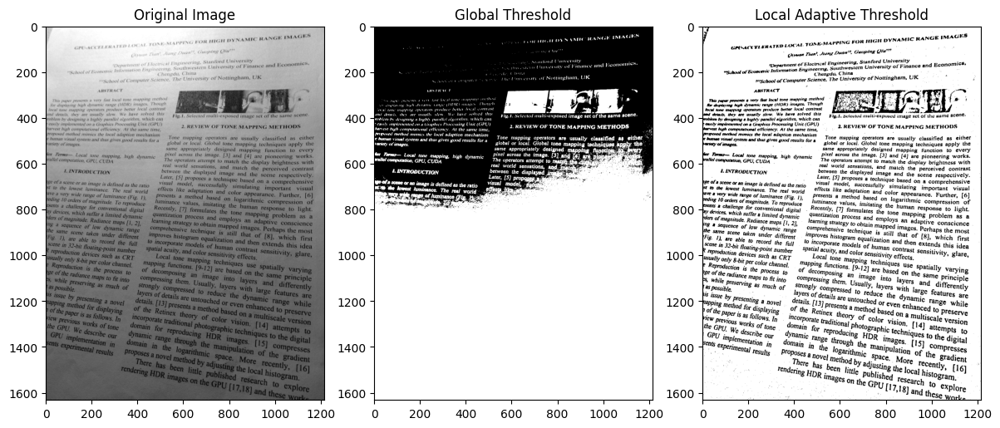

In [ ]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

# Load the image from URL
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/paper.png'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_GRAYSCALE)

# Global thresholding by Otsu method
_, global_bw_img = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Local adaptive thresholding
adaptive_thresh_img = cv2.adaptiveThreshold(
    img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 31, 10
)

# Display images
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(global_bw_img, cmap='gray')
plt.title('Global Threshold')

plt.subplot(1, 3, 3)
plt.imshow(adaptive_thresh_img, cmap='gray')
plt.title('Local Adaptive Threshold')

plt.tight_layout()
plt.show()

Problem_11_1 Pseudocolor Image Processing

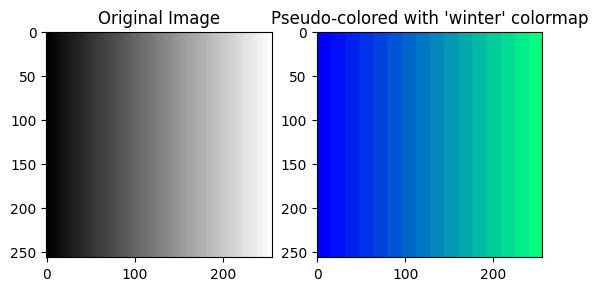

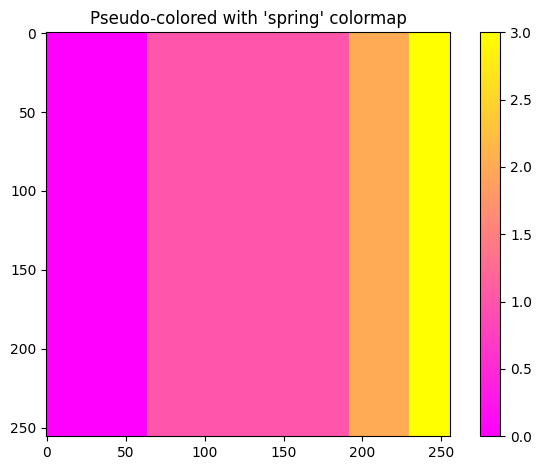

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Create and display a gradient image
I = np.tile(np.arange(256, dtype=np.uint8), (256, 1))
plt.subplot(1, 2, 1)
plt.imshow(I, cmap='gray')
plt.title('Original Image')

# Slice the image and display the results
I2 = np.floor(I / 16).astype(np.uint8)
plt.subplot(1, 2, 2)
plt.imshow(I2, cmap='winter')
plt.title("Pseudo-colored with 'winter' colormap")

# Slice the image into unequal partitions and display the results
levels = [0.25 * 255, 0.75 * 255, 0.9 * 255]
I3 = np.digitize(I, levels)
plt.figure()
plt.imshow(I3, cmap='spring')
plt.colorbar()
plt.title("Pseudo-colored with 'spring' colormap")

plt.tight_layout()
plt.show()

Problem_11_2 Pseudo-colored to grayscale image

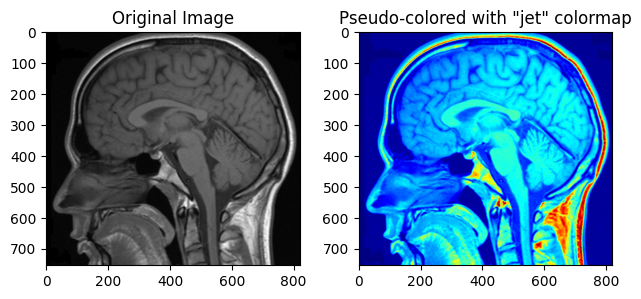

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/brain.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert image to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Pseudo-color the grayscale image
pseudo_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)

# Display the original and pseudo-colored images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(pseudo_img, cv2.COLOR_BGR2RGB))
plt.title('Pseudo-colored with "jet" colormap')

plt.tight_layout()
plt.show()

Problem_11_3full-color image processing

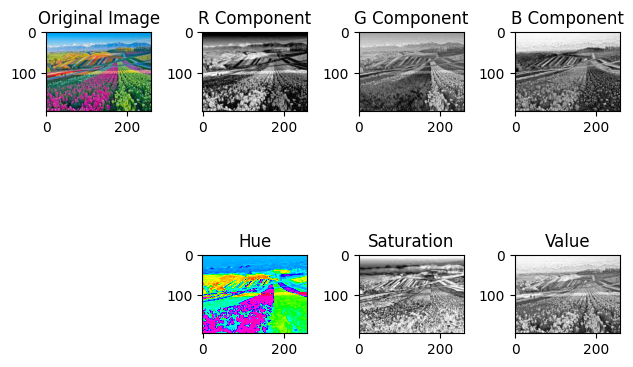

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flowerfield.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Display the original image and its components
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(2, 4, 2)
plt.imshow(img[:, :, 2], cmap='gray')
plt.title('R Component')

plt.subplot(2, 4, 3)
plt.imshow(img[:, :, 1], cmap='gray')
plt.title('G Component')

plt.subplot(2, 4, 4)
plt.imshow(img[:, :, 0], cmap='gray')
plt.title('B Component')

# Convert from BGR to HSV color model
imghsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Display the HSV components
plt.subplot(2, 4, 6)
plt.imshow(imghsv[:, :, 0], cmap='hsv')
plt.title('Hue')

plt.subplot(2, 4, 7)
plt.imshow(imghsv[:, :, 1], cmap='gray')
plt.title('Saturation')

plt.subplot(2, 4, 8)
plt.imshow(imghsv[:, :, 2], cmap='gray')
plt.title('Value')

plt.tight_layout()
plt.show()

Problem 11_4 compare grayscale image and value image in hsv

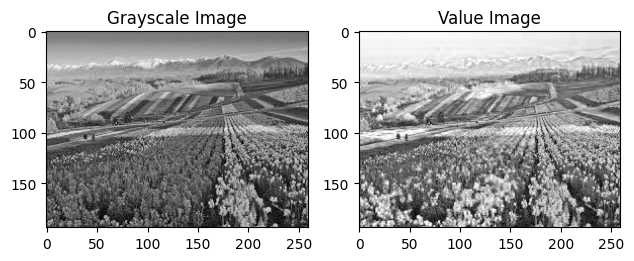

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flowerfield.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert the image to grayscale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Convert the image to HSV
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Display the grayscale image and value image in HSV
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Grayscale Image')

plt.subplot(1, 2, 2)
plt.imshow(img_hsv[:, :, 2], cmap='gray')
plt.title('Value Image')

plt.tight_layout()
plt.show()

Problem 11_5 smooth each component of color image by a filter

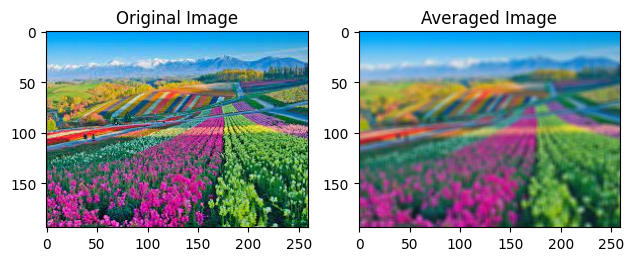

In [ ]:
import urllib.request
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/flowerfield.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Define a filter
filter_size = 5
filter_kernel = np.ones((filter_size, filter_size), np.float32) / (filter_size * filter_size)

# Split the image into color channels
b, g, r = cv2.split(img)

# Apply the filter to each channel
b_filtered = cv2.filter2D(b, -1, filter_kernel)
g_filtered = cv2.filter2D(g, -1, filter_kernel)
r_filtered = cv2.filter2D(r, -1, filter_kernel)

# Merge the filtered channels back into an image
img_filtered = cv2.merge((b_filtered, g_filtered, r_filtered))

# Plot and display the original and filtered images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_filtered, cv2.COLOR_BGR2RGB))
plt.title('Averaged Image')

plt.tight_layout()
plt.show()

Problem 11_6 Determinant of Hessian (DoH) Detector

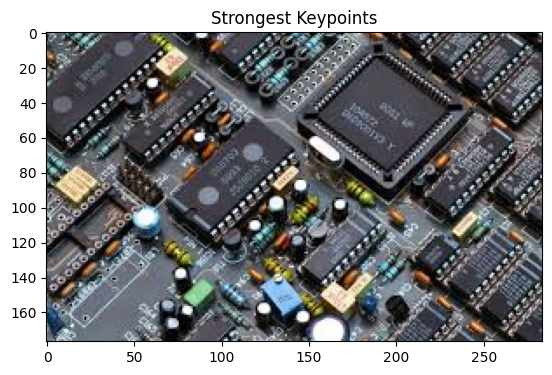

In [ ]:
import urllib.request
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image from Git repository
url = 'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/circuit.jpg'
resp = urllib.request.urlopen(url)
arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

# Convert the image to grayscale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Create filters
sigma = 2
g = cv2.getGaussianKernel(int(10 * sigma + 1), sigma)
sobel = cv2.getDerivKernels(1, 1, 3, normalize=False)

filterXG = cv2.filter2D(cv2.filter2D(g, -1, sobel[0]), -1, sobel[1].T, borderType=cv2.BORDER_REPLICATE)
filterYG = cv2.filter2D(cv2.filter2D(g, -1, sobel[1]), -1, sobel[0].T, borderType=cv2.BORDER_REPLICATE)
filterXYG = cv2.filter2D(cv2.filter2D(g, -1, sobel[0]), -1, sobel[1], borderType=cv2.BORDER_REPLICATE)

# Calculate Determinant of Hessian (DoH)
img_Dxx = cv2.filter2D(img_gray, -1, filterXG, borderType=cv2.BORDER_REPLICATE)
img_Dyy = cv2.filter2D(img_gray, -1, filterYG, borderType=cv2.BORDER_REPLICATE)
img_Dxy = cv2.filter2D(img_gray, -1, filterXYG, borderType=cv2.BORDER_REPLICATE)
img_filt = img_Dxx * img_Dyy - img_Dxy ** 2

# Find extrema (local maxima)
threshold = 0.5 * np.max(img_filt)
img_filt[img_filt < threshold] = 0
img_ext = cv2.dilate(cv2.compare(img_filt, cv2.dilate(img_filt, np.ones((3, 3))), cv2.CMP_EQ), np.ones((3, 3)))

# Show N strongest keypoints
num_corners = np.sum(img_ext)
responses = img_filt[img_ext == 1]
sort_indices = np.argsort(responses)[::-1]
n = min(20, len(sort_indices))  # N = 20 or total number of keypoints
fig, ax = plt.subplots()
ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
for i in range(n):
    idx = sort_indices[i]
    row, col = np.where(img_ext == 1)
    h = ax.plot(col[idx], row[idx], 'y+')
    plt.setp(h, 'markersize', 15, 'markerfacecolor', 'y')
plt.title("Strongest Keypoints")

plt.show()

problem_11_7 Harris Keypoint Detector

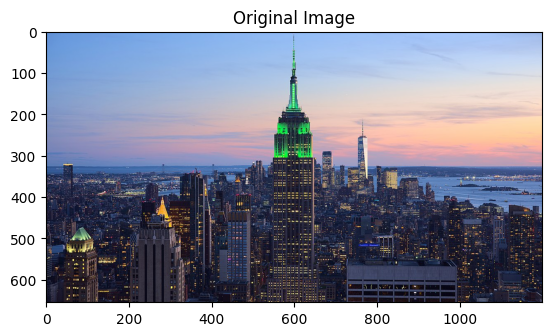

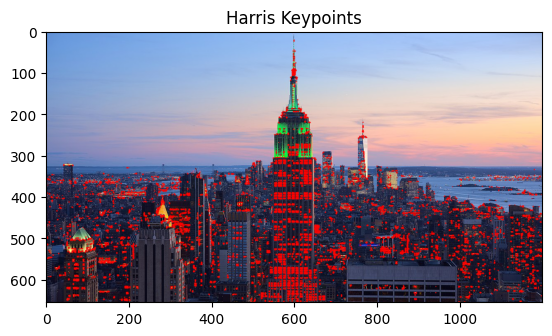

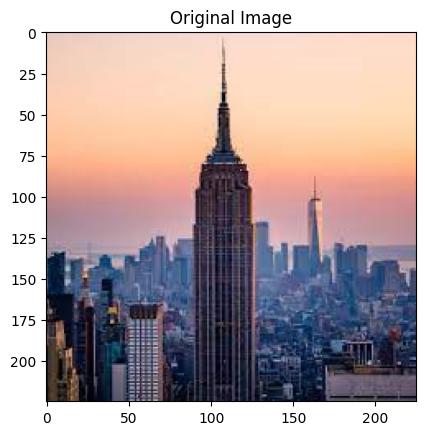

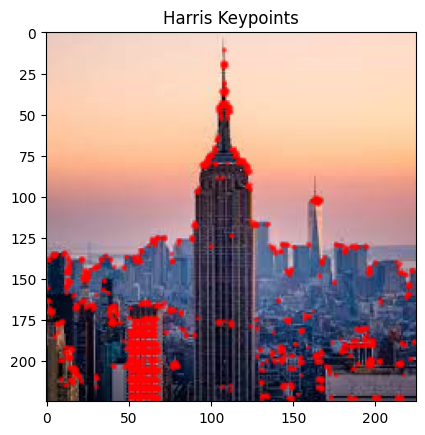

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# List of image filenames
images = ['Harris_a.jpeg', 'Harris_b.jpeg']

for image_filename in images:
    # Load the image from the Git repository
    image_url = f'https://raw.githubusercontent.com/ngoan22mse23088/ImageVideoProcessing/master/Images/{image_filename}'
    resp = urllib.request.urlopen(image_url)
    arr = np.asarray(bytearray(resp.read()), dtype=np.uint8)
    img = cv2.imdecode(arr, cv2.IMREAD_COLOR)

    # Convert the image to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Display the original image
    plt.figure()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.show()

    # Calculate Harris cornerness
    corners = cv2.cornerHarris(gray_img, blockSize=2, ksize=3, k=0.04)

    # Threshold the corners
    threshold = 0.01 * corners.max()
    corners_thresh = np.zeros_like(corners)
    corners_thresh[corners > threshold] = 255

    # Find keypoints
    keypoints = []
    for i in range(corners_thresh.shape[0]):
        for j in range(corners_thresh.shape[1]):
            if corners_thresh[i, j] == 255:
                keypoints.append(cv2.KeyPoint(j, i, 1))

    # Draw keypoints on the original image
    img_with_keypoints = cv2.drawKeypoints(img, keypoints, None, color=(0, 0, 255), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display the image with keypoints
    plt.figure()
    plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
    plt.title('Harris Keypoints')
    plt.show()

    # input("Press Enter to continue...")